<hr style="height:2px;">

# Demo: Apply trained CARE model for denoising of EM data with Noise2Noise

This notebook demonstrates applying a CARE model for a 2D denoising task, assuming that training was already completed via [2_training_SEM.ipynb](2_training_SEM.ipynb).  
The trained model is assumed to be located in the folder `models` with the name `my_model_n2n`.

More documentation is available at http://csbdeep.bioimagecomputing.com/doc/.

In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file, plot_some
from csbdeep.io import save_tiff_imagej_compatible
from csbdeep.models import CARE

2022-07-19 17:12:23.250666: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


<hr style="height:2px;">

# Raw low-SNR image and associated high-SNR ground truth

Plot the test stack pair and define its image axes, which will be needed later for CARE prediction.

In [2]:
from tifffile import imread, imwrite
data = imread('./data/SEM/test/test.tif').astype(np.float32)

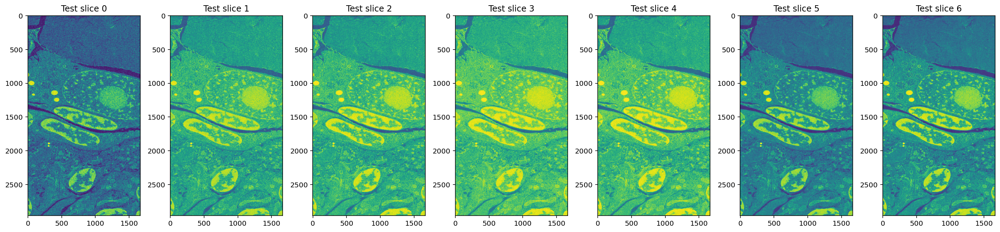

In [3]:
# Plot some test images
fig, axs = plt.subplots(1,data.shape[0], figsize=(20,20))
for i,ax in zip(range(0,data.shape[0]),axs.flatten()):
    ax.imshow(data[i])
    ax.set_title('Test slice {}'.format(i))
plt.tight_layout()
plt.show()

<hr style="height:2px;">

# CARE model

Load trained model (located in base directory `models` with name `my_model`) from disk.  
The configuration was saved during training and is automatically loaded when `CARE` is initialized with `config=None`.
The weights loaded from the .h5 file wer automatically saved by the package while training. (this is done bby CARE api but not all packages do this)

In [4]:
model = CARE(config=None, name='my_model_n2n', basedir='models')

Loading network weights from 'weights_best.h5'.


2022-07-19 17:17:03.611197: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-07-19 17:17:03.625412: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-19 17:17:03.625776: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:02:01.0 name: NVIDIA A40-16Q computeCapability: 8.6
coreClock: 1.74GHz coreCount: 84 deviceMemorySize: 15.82GiB deviceMemoryBandwidth: 648.29GiB/s
2022-07-19 17:17:03.625791: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-19 17:17:03.634935: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-07-19 17:17:03.634967: I tensorflow/stream_executor/platform/def

## Apply CARE network to raw image

Predict the restored image (image will be successively split into smaller tiles if there are memory issues).

In [7]:
# Select image to predict on, use the third image
x = data[2,:,:,np.newaxis]

In [8]:
%%time
restored = model.predict(x, 'XYC')

2022-07-19 17:22:43.960347: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-07-19 17:22:43.960636: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2949995000 Hz
2022-07-19 17:22:44.056314: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-07-19 17:22:44.464562: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8201
2022-07-19 17:22:45.067591: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-19 17:22:45.067624: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2022-07-19 17:22:45.067992: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-07-19 17:22:45.068048: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

CPU times: user 4.88 s, sys: 636 ms, total: 5.52 s
Wall time: 8 s


Alternatively, one can directly set `n_tiles` to avoid the time overhead from multiple retries in case of memory issues.

**Note**: *Out of memory* problems during `model.predict` can also indicate that the GPU is used by another process. In particular, shut down the training notebook before running the prediction (you may need to restart this notebook).

In [ ]:
#%%time
#restored = model.predict(x, axes, n_tiles=(1,4,4))

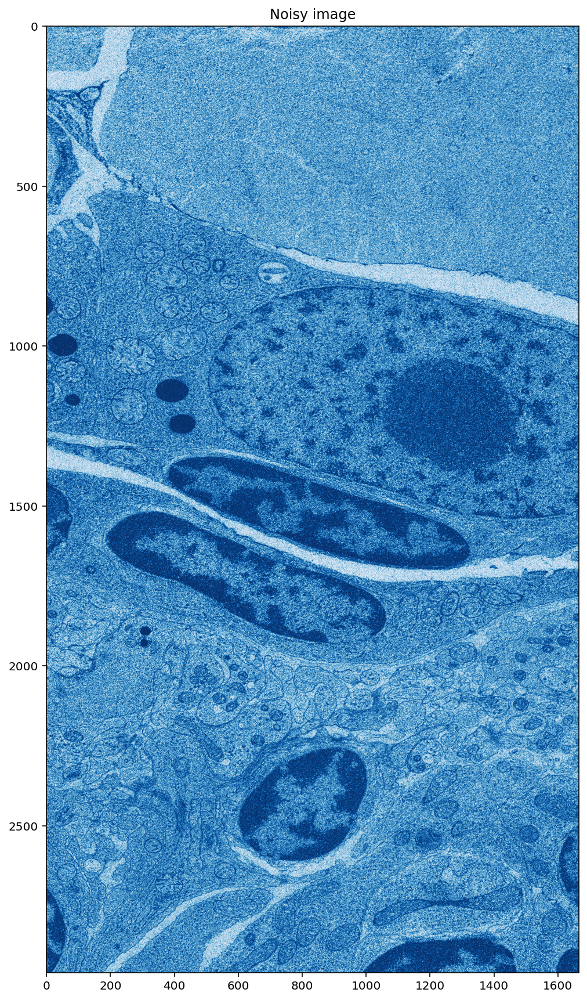

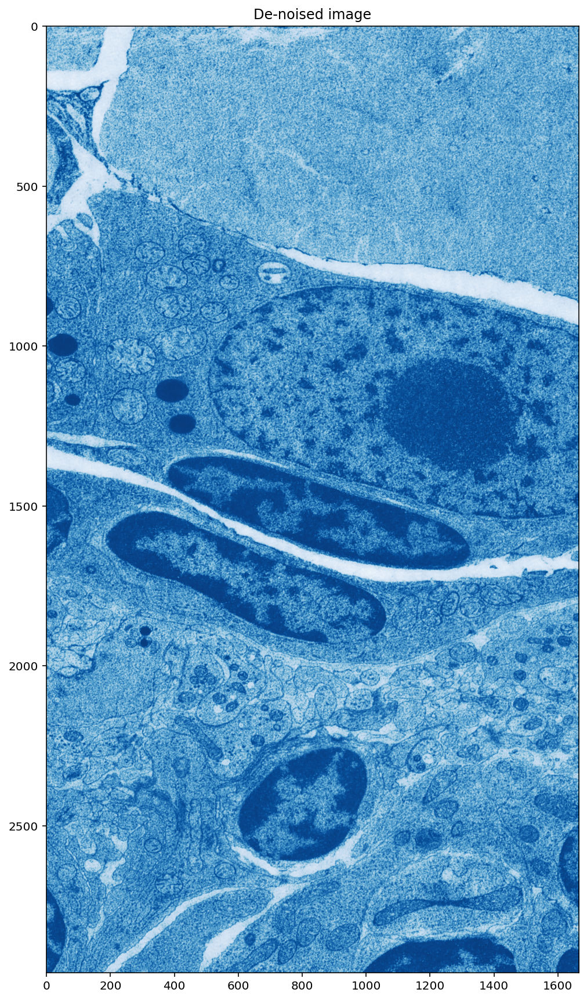

In [10]:
# Plot images of noised and de-noised with Noise2Noise
plt.figure(figsize=(15,15))
plt.imshow(x, cmap='Blues')
plt.title('Noisy image')
plt.show()

plt.figure(figsize=(15,15))
plt.imshow(restored, cmap='Blues')
plt.title('De-noised image')
plt.show()